## Import 

In [1]:
import numpy as np
import pandas as pd
import math

from sklearn.model_selection import train_test_split, cross_validate

from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.base import BaseEstimator, ClassifierMixin, TransformerMixin
from sklearn.utils.multiclass import unique_labels
from sklearn.utils.validation import check_is_fitted

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, RidgeCV, LassoCV, ElasticNetCV, RidgeClassifierCV
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import VotingClassifier,RandomForestClassifier

from sktime.datatypes._panel._convert import from_2d_array_to_nested
from sktime.transformations.panel.rocket import Rocket, MiniRocket
from sktime.classification.feature_based import FreshPRINCE
from sktime.classification.dictionary_based import WEASEL
from sktime.contrib.vector_classifiers._rotation_forest import RotationForest
from sktime.transformations.panel.tsfresh import TSFreshFeatureExtractor, TSFreshRelevantFeatureExtractor


from mrsqm import MrSQMClassifier

import matplotlib.pyplot as plt

## Load data from XLS file

In [2]:
#load data
df_dict = pd.read_excel('dataset.xlsx',sheet_name=None)
df = df_dict["Training"]

In [3]:
df

,Diet,col1,col2,col3,col4,col5,col6,col7,col8,col9,...,col1051,col1052,col1053,col1054,col1055,col1056,col1057,col1058,col1059,col1060
0,GRS,1.285407,1.270682,1.256961,1.243545,1.230510,1.217927,1.205841,1.194133,1.182280,...,0.953018,0.953452,0.953923,0.954405,0.954882,0.955351,0.955824,0.956178,0.956678,0.957184
1,GRS,1.184143,1.174105,1.164920,1.156222,1.148060,1.140399,1.133123,1.125951,1.118246,...,0.978003,0.978359,0.978767,0.979192,0.979599,0.979972,0.980313,0.980553,0.980892,0.981262
2,GRS,1.367154,1.348666,1.331992,1.315673,1.299387,1.283017,1.266661,1.250464,1.234278,...,0.919751,0.920195,0.920649,0.921126,0.921624,0.922130,0.922627,0.922959,0.923418,0.923863
3,GRS,1.204441,1.193640,1.183685,1.174031,1.164706,1.155768,1.147259,1.139031,1.130472,...,0.972673,0.973021,0.973390,0.973784,0.974206,0.974654,0.975121,0.975456,0.975953,0.976483
4,GRS,1.280609,1.264384,1.250152,1.237041,1.224849,1.213294,1.202137,1.191109,1.179676,...,0.958123,0.958400,0.958773,0.959264,0.959864,0.960536,0.961223,0.961681,0.962278,0.962797
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3270,GRS,1.213312,1.202898,1.192979,1.183070,1.173258,1.163687,1.154485,1.145573,1.136412,...,0.977045,0.977397,0.977796,0.978287,0.978877,0.979520,0.980126,0.980495,0.980838,0.981012
3271,GRS,1.237686,1.225234,1.213955,1.203258,1.193050,1.183187,1.173519,1.163812,1.153537,...,0.974139,0.974664,0.975183,0.975691,0.976201,0.976722,0.977244,0.977611,0.978057,0.978427
3272,GRS,1.200487,1.188777,1.178158,1.168262,1.159146,1.150749,1.142909,1.135273,1.127115,...,0.973785,0.973823,0.974079,0.974619,0.975422,0.976390,0.977385,0.978060,0.978816,0.979346
3273,GRS,1.140687,1.133632,1.126725,1.119882,1.113217,1.106741,1.100430,1.094207,1.087855,...,0.963652,0.963833,0.964122,0.964457,0.964754,0.964954,0.965064,0.965128,0.965281,0.965610


## Data Exploration



In [4]:
import plotly.graph_objects as go

x_range = [x for x in range(df.shape[1] - 1)]
# Create traces
fig = go.Figure()
for index, row in df.iloc[:200,:].iterrows():
    fig.add_trace(go.Scatter(x=x_range, y=row[1:],
                    mode='lines',
                    name='lines'))
    
fig.add_trace(go.Scatter(x=[172, 172], y=[-1, 4],
    fill=None,
    mode='lines',
    line_color='indigo',
    ))
fig.add_trace(go.Scatter(
    x=[205,205],
    y=[-1, 4],
    fill='tonexty', # fill area between trace0 and trace1
    mode='lines', line_color='indigo'))

fig.add_trace(go.Scatter(x=[536, 536], y=[-1, 4],
    fill=None,
    mode='lines',
    line_color='indigo',
    ))
fig.add_trace(go.Scatter(
    x=[728,728],
    y=[-1, 4],
    fill='tonexty', # fill area between trace0 and trace1
    mode='lines', line_color='indigo'))

fig.add_trace(go.Scatter(x=[748, 748], y=[-1, 4],
    fill=None,
    mode='lines',
    line_color='indigo',
    ))
fig.add_trace(go.Scatter(
    x=[1060,1060],
    y=[-1, 4],
    fill='tonexty', # fill area between trace0 and trace1
    mode='lines', line_color='indigo'))

fig.update_yaxes(
    range=(-0.5, 4),
    constrain='domain'
)

fig.show()

<AxesSubplot:>

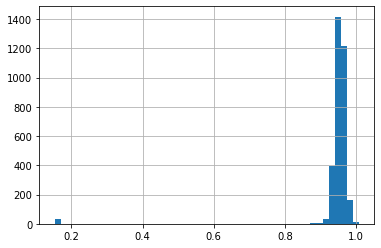

In [5]:
# Looks like there are a few outliers ...
row_means = df.iloc[:,1:].mean(axis=1)
row_means.hist(bins = 50)

In [6]:
df[row_means < 0.8]

,Diet,col1,col2,col3,col4,col5,col6,col7,col8,col9,...,col1051,col1052,col1053,col1054,col1055,col1056,col1057,col1058,col1059,col1060
55,CLV,0.205013,0.201666,0.198552,0.195494,0.192511,0.189602,0.186738,0.183872,0.180950,...,0.144851,0.144911,0.144974,0.145042,0.145119,0.145207,0.145307,0.145385,0.145496,0.145604
95,TMR,0.207417,0.203752,0.200383,0.197109,0.193947,0.190888,0.187902,0.184936,0.181932,...,0.143948,0.144019,0.144091,0.144169,0.144255,0.144351,0.144457,0.144539,0.144654,0.144765
181,TMR,0.204873,0.201470,0.198321,0.195244,0.192256,0.189356,0.186513,0.183675,0.180788,...,0.146144,0.146209,0.146271,0.146334,0.146401,0.146476,0.146558,0.146621,0.146710,0.146794
199,CLV,0.202806,0.199439,0.196323,0.193276,0.190317,0.187440,0.184616,0.181795,0.178922,...,0.143351,0.143395,0.143440,0.143489,0.143549,0.143620,0.143704,0.143772,0.143871,0.143969
222,CLV,0.201274,0.198023,0.195062,0.192196,0.189422,0.186721,0.184058,0.181385,0.178654,...,0.145391,0.145488,0.145586,0.145686,0.145788,0.145892,0.145997,0.146070,0.146164,0.146246
240,CLV,0.211825,0.208185,0.204783,0.201431,0.198156,0.194960,0.191822,0.188698,0.185537,...,0.143174,0.143257,0.143340,0.143424,0.143513,0.143609,0.143711,0.143787,0.143892,0.143990
241,CLV,0.208677,0.205104,0.201796,0.198562,0.195420,0.192370,0.189383,0.186413,0.183407,...,0.145070,0.145147,0.145223,0.145301,0.145383,0.145470,0.145564,0.145634,0.145730,0.145818
315,GRS,0.208353,0.204709,0.201327,0.198017,0.194804,0.191689,0.188645,0.185623,0.182570,...,0.144941,0.145018,0.145096,0.145178,0.145266,0.145362,0.145467,0.145546,0.145656,0.145760
378,GRS,0.205177,0.201741,0.198572,0.195479,0.192476,0.189557,0.186690,0.183823,0.180900,...,0.143564,0.143617,0.143666,0.143716,0.143771,0.143835,0.143908,0.143965,0.144049,0.144131
400,GRS,0.201933,0.198778,0.195837,0.192948,0.190129,0.187381,0.184676,0.181968,0.179204,...,0.144085,0.144155,0.144225,0.144299,0.144380,0.144469,0.144566,0.144639,0.144741,0.144837


In [7]:
df[row_means < 0.8]["Diet"].value_counts() # seems they are not diet related

CLV    12
GRS    12
TMR     7
Name: Diet, dtype: int64

<AxesSubplot:>

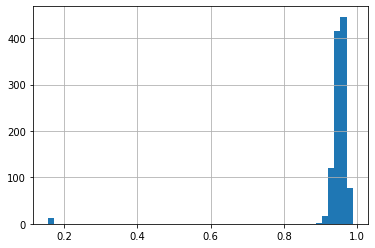

In [8]:
df_dict["Test"].mean(axis=1).hist(bins = 50) # same with test set

In [9]:
df_dict["Test"][(df_dict["Test"].mean(axis=1) < 0.8) | (df_dict["Test"].std(axis=1) < 0.1)]

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,...,col1051,col1052,col1053,col1054,col1055,col1056,col1057,col1058,col1059,col1060
5,0.215869,0.211774,0.207990,0.204294,0.200707,0.197228,0.193828,0.190461,0.187069,0.183602,...,0.141888,0.141956,0.142022,0.142091,0.142167,0.142252,0.142346,0.142419,0.142523,0.142624
27,0.210214,0.206427,0.202917,0.199490,0.196173,0.192970,0.189856,0.186786,0.183706,0.180563,...,0.143367,0.143427,0.143489,0.143558,0.143635,0.143725,0.143827,0.143907,0.144023,0.144139
50,0.202345,0.199096,0.196168,0.193352,0.190633,0.187983,0.185358,0.182708,0.179980,0.177130,...,0.146931,0.147011,0.147094,0.147182,0.147275,0.147373,0.147474,0.147546,0.147638,0.147717
67,0.204823,0.201284,0.197999,0.194793,0.191695,0.188710,0.185812,0.182953,0.180079,0.177134,...,0.144210,0.144285,0.144363,0.144447,0.144540,0.144645,0.144759,0.144847,0.144970,0.145087
90,0.203446,0.199987,0.196796,0.193687,0.190677,0.187762,0.184908,0.182064,0.179169,0.176169,...,0.146198,0.146254,0.146308,0.146363,0.146423,0.146491,0.146567,0.146627,0.146712,0.146794
99,1.083642,1.078470,1.073683,1.069281,1.065422,1.062099,1.059206,1.056548,1.053782,1.050345,...,0.979210,0.979171,0.979125,0.979106,0.979165,0.979345,0.979661,0.979943,0.980415,0.980886
121,0.206038,0.202634,0.199459,0.196337,0.193289,0.190315,0.187389,0.184465,0.181488,0.178407,...,0.142018,0.142095,0.142170,0.142245,0.142323,0.142407,0.142498,0.142566,0.142660,0.142748
146,0.211106,0.207183,0.203578,0.200080,0.196711,0.193469,0.190325,0.187232,0.184132,0.180972,...,0.144471,0.144537,0.144602,0.144669,0.144740,0.144820,0.144908,0.144975,0.145070,0.145161
168,0.204234,0.200925,0.197868,0.194880,0.191974,0.189147,0.186366,0.183584,0.180745,0.177799,...,0.146326,0.146394,0.146458,0.146524,0.146595,0.146673,0.146760,0.146828,0.146924,0.147016
180,0.210615,0.206811,0.203382,0.200085,0.196902,0.193804,0.190745,0.187669,0.184524,0.181263,...,0.141413,0.141501,0.141591,0.141684,0.141782,0.141882,0.141984,0.142056,0.142149,0.142229


<AxesSubplot:>

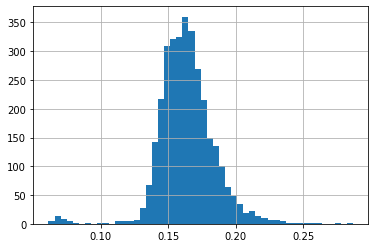

In [10]:
row_stds = df.iloc[:,1:].std(axis=1)
row_stds.hist(bins = 50)

In [11]:
df[row_stds < 0.1]

,Diet,col1,col2,col3,col4,col5,col6,col7,col8,col9,...,col1051,col1052,col1053,col1054,col1055,col1056,col1057,col1058,col1059,col1060
55,CLV,0.205013,0.201666,0.198552,0.195494,0.192511,0.189602,0.186738,0.183872,0.180950,...,0.144851,0.144911,0.144974,0.145042,0.145119,0.145207,0.145307,0.145385,0.145496,0.145604
95,TMR,0.207417,0.203752,0.200383,0.197109,0.193947,0.190888,0.187902,0.184936,0.181932,...,0.143948,0.144019,0.144091,0.144169,0.144255,0.144351,0.144457,0.144539,0.144654,0.144765
181,TMR,0.204873,0.201470,0.198321,0.195244,0.192256,0.189356,0.186513,0.183675,0.180788,...,0.146144,0.146209,0.146271,0.146334,0.146401,0.146476,0.146558,0.146621,0.146710,0.146794
199,CLV,0.202806,0.199439,0.196323,0.193276,0.190317,0.187440,0.184616,0.181795,0.178922,...,0.143351,0.143395,0.143440,0.143489,0.143549,0.143620,0.143704,0.143772,0.143871,0.143969
222,CLV,0.201274,0.198023,0.195062,0.192196,0.189422,0.186721,0.184058,0.181385,0.178654,...,0.145391,0.145488,0.145586,0.145686,0.145788,0.145892,0.145997,0.146070,0.146164,0.146246
240,CLV,0.211825,0.208185,0.204783,0.201431,0.198156,0.194960,0.191822,0.188698,0.185537,...,0.143174,0.143257,0.143340,0.143424,0.143513,0.143609,0.143711,0.143787,0.143892,0.143990
241,CLV,0.208677,0.205104,0.201796,0.198562,0.195420,0.192370,0.189383,0.186413,0.183407,...,0.145070,0.145147,0.145223,0.145301,0.145383,0.145470,0.145564,0.145634,0.145730,0.145818
290,TMR,1.096022,1.089992,1.084557,1.079473,1.074891,1.070895,1.067460,1.064370,1.061097,...,0.982805,0.982873,0.983006,0.983195,0.983414,0.983639,0.983855,0.983997,0.984210,0.984450
315,GRS,0.208353,0.204709,0.201327,0.198017,0.194804,0.191689,0.188645,0.185623,0.182570,...,0.144941,0.145018,0.145096,0.145178,0.145266,0.145362,0.145467,0.145546,0.145656,0.145760
378,GRS,0.205177,0.201741,0.198572,0.195479,0.192476,0.189557,0.186690,0.183823,0.180900,...,0.143564,0.143617,0.143666,0.143716,0.143771,0.143835,0.143908,0.143965,0.144049,0.144131


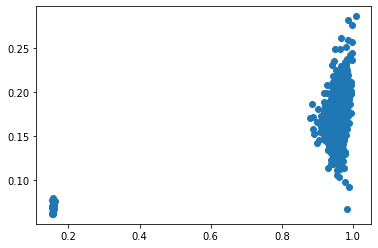

In [12]:
plt.scatter(row_means,row_stds)

In [13]:
x_range = [x for x in range(df.shape[1] - 1)]
# Create traces
fig = go.Figure()
for index, row in df[(row_means < 0.8) | (row_stds < 0.1)].iterrows():
    fig.add_trace(go.Scatter(x=x_range, y=row[1:],
                    mode='lines',
                    name='lines'))
    


# fig.update_yaxes(
#     range=(-0.5, 4),
#     constrain='domain'
# )

fig.show()

## Clean, Shuffle and Split data

In [14]:
#load data
#df_dict = pd.read_excel('dataset.xlsx',sheet_name=None)
#df = df_dict["Training"]

remove_outliers = True
normalization = False

tmp_df = df.copy()
if remove_outliers:
    #tmp_df = tmp_df[tmp_df.iloc[:,1:].mean(axis=1) > 0.8]
    tmp_df = tmp_df[tmp_df['col1'] >= 1]
    


#shuffle
tmp_df = tmp_df.sample(frac=1,random_state=0).reset_index(drop=True)

X = tmp_df.iloc[:,1:].values
Y = tmp_df["Diet"].values

if normalization:
    X = X.sub(X.mean(1), axis=0).div(X.std(1), axis=0)

X_ts = from_2d_array_to_nested(X)

## Models

In [15]:
class RocketNormalizer(BaseEstimator, TransformerMixin):            
            
    def fit(self, X, y = None):        
        self._mean = X.mean(0)
        self._norm = np.sqrt(np.square(X - self._mean).sum(axis=0)) + 1e-8        
        return self    
    
    def transform(self, X, y = None):                
        return (X - self._mean) / self._norm

def rocket_clf(verbose=True):
    return Pipeline(
            [            
            ('rocket', Rocket(random_state=0,normalise=True)),
            ('normalizer', RocketNormalizer()),
            ('model', RidgeClassifierCV(alphas=np.logspace(-3, 3, 10)))           
            ],
            verbose=verbose,
        )

def minirocket_clf(verbose=True):
    return Pipeline(
            [            
            ('minirocket', MiniRocket(random_state=0)),
            ('normalizer', RocketNormalizer()), # StandardScaler seems to be a bit better ?
            ('model', RidgeClassifierCV(alphas=np.logspace(-3, 3, 10)))           
            ],
            verbose=verbose,
        )
def freshprince_clf(fc_pars = "minimal",verbose=True):
    return Pipeline(
        [
            ('tsfresh', TSFreshFeatureExtractor(default_fc_parameters=fc_pars, show_warnings=False)),
            ('rotationforest', RotationForest(random_state=42))
        ],
        verbose=verbose,
    )

def freshprince_fs_clf(fc_pars = "efficient",verbose=True):
    return Pipeline(
        [
            ('tsfresh', TSFreshRelevantFeatureExtractor(default_fc_parameters=fc_pars, show_warnings=False, ml_task="classification")),
            ('rotationforest', RotationForest(random_state=42))
        ],
        verbose=verbose,
    )


In [16]:


class SkMrSQMClassifier(BaseEstimator, ClassifierMixin):

    def __init__(self, nsax, nsfa):
        # self.demo_param = demo_param
        self.nsax = nsax
        self.nsfa = nsfa
        

    def fit(self, X, y):
        
        self.clf = MrSQMClassifier(strat = 'RS', nsax = self.nsax, nsfa = self.nsfa, features_per_rep = 500, selection_per_rep = 2000, random_state=0)

        # Check that X and y have correct shape
        # X, y = check_X_y(X, y)
        # Store the classes seen during fit
        self.classes_ =  unique_labels(y)

        #self.X_ = X
        # self.y_ = y
        # Return the classifier
        self.clf.fit(X,y)
        return self

    def predict(self, X):

        # Check is fit had been called
        check_is_fitted(self)

        # Input validation
        # X = check_array(X)

        # closest = np.argmin(euclidean_distances(X, self.X_), axis=1)
        return self.clf.predict(X)

In [17]:
def exp_single_clf(clf, X_train, X_test, y_train, y_test):    
    clf.fit(X_train,y_train)
    y_pred = clf.predict(X_test)
    return accuracy_score(y_test, y_pred)

def exp_multiple_classifiers(clfs, X_train, X_test, y_train, y_test):
    results = dict.fromkeys(clfs.keys(),0)
    
    for c in clfs:
        results[c] = exp_single_clf(clfs[c], X_train, X_test, y_train, y_test)
    
    return results

## Single split experiments

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X_ts, Y, test_size=0.4, random_state=0)


### ROCKET

Classifier: Rocket
[Pipeline] ............ (step 1 of 3) Processing rocket, total= 5.5min
[Pipeline] ........ (step 2 of 3) Processing normalizer, total=   0.4s
[Pipeline] ............. (step 3 of 3) Processing model, total=   3.1s
Accuracy: 0.4445300462249615


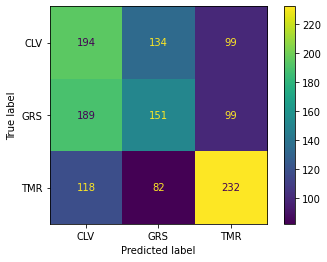

In [19]:
print("Classifier: Rocket")
clf = rocket_clf()
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=clf.classes_)
disp.plot()
plt.show()

Classifier: MiniRocket
[Pipeline] ........ (step 1 of 3) Processing minirocket, total=  17.4s
[Pipeline] ........ (step 2 of 3) Processing normalizer, total=   0.1s
[Pipeline] ............. (step 3 of 3) Processing model, total=   2.4s
Accuracy: 0.514637904468413


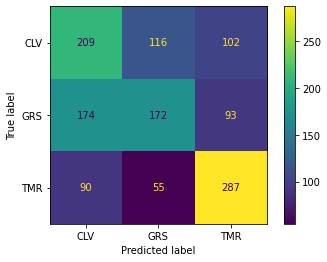

In [20]:
print("Classifier: MiniRocket")
clf = minirocket_clf()
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=clf.classes_)
disp.plot()
plt.show()

### WEASEL

Classifier: WEASEL


/home/thalng/anaconda3/envs/vistamilk/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



Accuracy: 0.5061633281972265


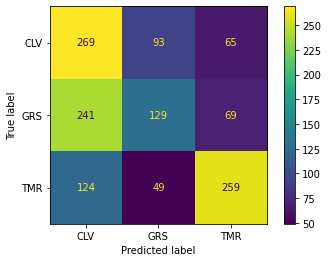

In [21]:
print("Classifier: WEASEL")
clf = WEASEL()
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=clf.classes_)
disp.plot()
plt.show()

### FreshPRINCE
https://arxiv.org/pdf/2201.12048.pdf

In [22]:
# TSFresh features
transformer = TSFreshFeatureExtractor(default_fc_parameters="minimal", show_warnings=False).fit(X_train,y_train)
print(f'Minimal features: {transformer.transform(X_train.iloc[:5,:]).shape[1]} features')

transformer = TSFreshFeatureExtractor(default_fc_parameters="efficient", show_warnings=False).fit(X_train,y_train)
print(f'Efficient features: {transformer.transform(X_train.iloc[:5,:]).shape[1]} features')

transformer = TSFreshFeatureExtractor(default_fc_parameters="comprehensive", show_warnings=False).fit(X_train,y_train)
print(f'Comprehensive features: {transformer.transform(X_train.iloc[:5,:]).shape[1]} features')

transformer = TSFreshRelevantFeatureExtractor(default_fc_parameters="efficient", show_warnings=False, ml_task="classification").fit(X_train.reset_index(drop=True),y_train)
print(f'Relevant efficient features: {transformer.transform(X_train.iloc[:5,:]).shape[1]} features')

transformer = TSFreshRelevantFeatureExtractor(default_fc_parameters="comprehensive", show_warnings=False, ml_task="classification").fit(X_train.reset_index(drop=True),y_train)
print(f'Relevant comprehensive features: {transformer.transform(X_train.iloc[:5,:]).shape[1]} features')

Feature Extraction: 100%|████████████████████████| 5/5 [00:00<00:00, 703.39it/s]


Minimal features: 10 features


Feature Extraction: 100%|█████████████████████████| 5/5 [00:01<00:00,  4.21it/s]


Efficient features: 783 features


Feature Extraction: 100%|█████████████████████████| 5/5 [00:04<00:00,  1.10it/s]


Comprehensive features: 789 features


Feature Extraction: 100%|█████████████████████████| 5/5 [00:01<00:00,  4.39it/s]


Relevant efficient features: 39 features


Feature Extraction: 100%|█████████████████████████| 5/5 [00:04<00:00,  1.10it/s]

Relevant comprehensive features: 39 features


Classifier: FreshPRINCE-minimal


Feature Extraction: 100%|█████████████████| 1946/1946 [00:01<00:00, 1366.24it/s]


[Pipeline] ........... (step 1 of 2) Processing tsfresh, total=   6.0s
[Pipeline] .... (step 2 of 2) Processing rotationforest, total=   7.5s


Feature Extraction: 100%|█████████████████| 1298/1298 [00:00<00:00, 1395.11it/s]


Accuracy: 0.3405238828967643


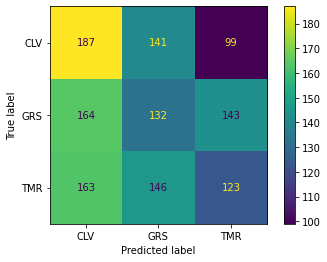

In [23]:
print("Classifier: FreshPRINCE-minimal")
clf = freshprince_clf(fc_pars = "minimal")
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=clf.classes_)
disp.plot()
plt.show()

Classifier: FreshPRINCE-efficient


Feature Extraction: 100%|███████████████████| 1946/1946 [07:38<00:00,  4.24it/s]


[Pipeline] ........... (step 1 of 2) Processing tsfresh, total= 7.8min
[Pipeline] .... (step 2 of 2) Processing rotationforest, total= 5.2min


Feature Extraction: 100%|███████████████████| 1298/1298 [04:52<00:00,  4.44it/s]


Accuracy: 0.5577812018489985


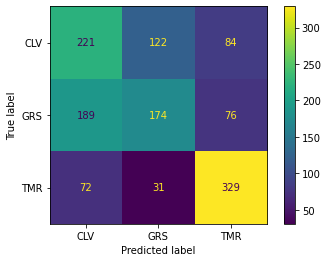

In [24]:
print("Classifier: FreshPRINCE-efficient")
clf = freshprince_clf(fc_pars = "efficient")
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=clf.classes_)
disp.plot()
plt.show()

Classifier: FreshPRINCE-comprehensive


Feature Extraction: 100%|███████████████████| 1946/1946 [27:18<00:00,  1.19it/s]


[Pipeline] ........... (step 1 of 2) Processing tsfresh, total=27.4min
[Pipeline] .... (step 2 of 2) Processing rotationforest, total= 5.3min


Feature Extraction: 100%|███████████████████| 1298/1298 [18:06<00:00,  1.19it/s]


Accuracy: 0.5631741140215717


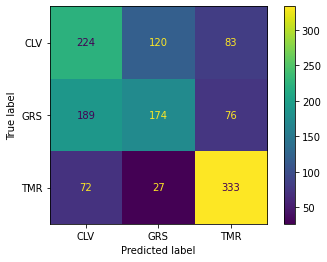

In [25]:
print("Classifier: FreshPRINCE-comprehensive")
clf = freshprince_clf(fc_pars = "comprehensive")
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=clf.classes_)
disp.plot()
plt.show()

Classifier: FreshPRINCE-relevant-efficient


Feature Extraction: 100%|███████████████████| 1946/1946 [07:00<00:00,  4.62it/s]


[Pipeline] ........... (step 1 of 2) Processing tsfresh, total=14.3min
[Pipeline] .... (step 2 of 2) Processing rotationforest, total=  17.9s


Feature Extraction: 100%|███████████████████| 1298/1298 [04:38<00:00,  4.66it/s]


Accuracy: 0.5970724191063174


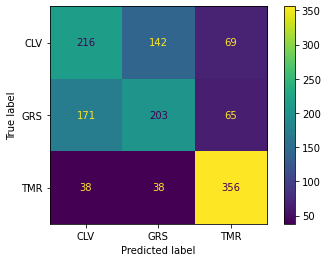

In [26]:
print("Classifier: FreshPRINCE-relevant-efficient")
clf = freshprince_fs_clf()
clf.fit(X_train.reset_index(drop=True),y_train) # this module has issue with the shuffled indices
y_pred = clf.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=clf.classes_)
disp.plot()
plt.show()

Classifier: FreshPRINCE-relevant-comprehensive


Feature Extraction: 100%|███████████████████| 1946/1946 [26:36<00:00,  1.22it/s]


[Pipeline] ........... (step 1 of 2) Processing tsfresh, total=53.8min
[Pipeline] .... (step 2 of 2) Processing rotationforest, total=  17.6s


Feature Extraction: 100%|███████████████████| 1298/1298 [17:35<00:00,  1.23it/s]


Accuracy: 0.5970724191063174


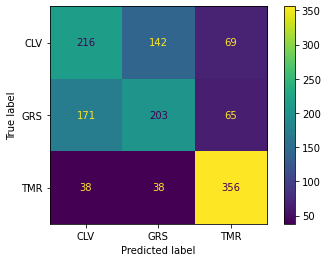

In [27]:
print("Classifier: FreshPRINCE-relevant-comprehensive")
clf = freshprince_fs_clf(fc_pars = "comprehensive")
clf.fit(X_train.reset_index(drop=True),y_train)
y_pred = clf.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=clf.classes_)
disp.plot()
plt.show()

### MrSQM

Classifier: MrSQM
Accuracy: 0.588597842835131


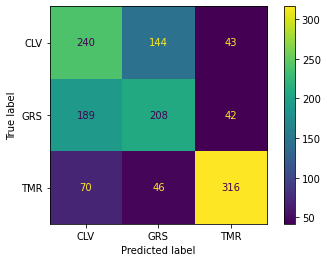

In [28]:
print("Classifier: MrSQM")
#clf = MrSQMClassifier(strat = 'RS', nsax = 0, nsfa = 11, features_per_rep = 500, selection_per_rep = 2000, random_state=0)
clf = SkMrSQMClassifier(nsax = 0, nsfa = 9)
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=clf.classes_)
disp.plot()
plt.show()

## Cross validation exp

In [29]:
scores = cross_validate(minirocket_clf(verbose=False), X_ts, Y, scoring="accuracy", cv=3)
print(f"MiniROCKET CV: {np.mean(scores['test_score'])}")


MiniROCKET CV: 0.5061605744891743


In [30]:
scores = cross_validate(freshprince_clf(fc_pars = "efficient",verbose=False), X_ts, Y, scoring="accuracy", cv=3)
print(f"FreshPRINCE-efficient CV: {np.mean(scores['test_score'])}")

Feature Extraction: 100%|███████████████████| 1081/1081 [03:50<00:00,  4.69it/s]


FreshPRINCE-efficient CV: 0.5582639816285667


In [31]:
scores = cross_validate(SkMrSQMClassifier(nsax=0,nsfa=9), X_ts, Y, scoring="accuracy", cv=3)
print(f"MrSQM_9xsfa CV: {np.mean(scores['test_score'])}")

MrSQM_9xsfa CV: 0.6149793412571255


# Water Region Removal

### Pipelines

In [32]:
class RocketNormalizer(BaseEstimator, TransformerMixin):            
            
    def fit(self, X, y = None):        
        self._mean = X.mean(0)
        self._norm = np.sqrt(np.square(X - self._mean).sum(axis=0)) + 1e-8        
        return self    
    
    def transform(self, X, y = None):                
        return (X - self._mean) / self._norm


class IntervalSelector(BaseEstimator, TransformerMixin):
    # initializer 
    def __init__(self, start = 0, end = 10, return_timeseries = True):        
        self.start = start
        self.end = end
        self.return_timeseries = return_timeseries
            
            
    def fit(self, X, y = None):        
        return self    
    
    def transform(self, X, y = None):             
        if self.return_timeseries:            
            return from_2d_array_to_nested(X[:,self.start:self.end])
        else:
            return X[:,self.start:self.end]

class RotationForestClassifier(BaseEstimator, ClassifierMixin):    
        

    def fit(self, X, y):
        
        self.clf = RotationForest(random_state=42)

        # Check that X and y have correct shape
        # X, y = check_X_y(X, y)
        # Store the classes seen during fit
        self.classes_ =  unique_labels(y)

        #self.X_ = X
        # self.y_ = y
        # Return the classifier
        self.clf.fit(X,y)
        return self

    def predict(self, X):

        # Check is fit had been called
        check_is_fitted(self)

        # Input validation
        # X = check_array(X)

        # closest = np.argmin(euclidean_distances(X, self.X_), axis=1)
        return self.clf.predict(X)


In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.4, random_state=0)

intervals = [(0,172),(206,536),(729,748)]
results = {}

for itv_start, itv_end in intervals:
    print('----------------------')
    print(f'Interval: {itv_start} - {itv_end}')
    print('----------------------')
    chopper = IntervalSelector(itv_start,itv_end)
    X_train_itv = chopper.transform(X_train)
    X_test_itv = chopper.transform(X_test)
    
    clfs = {"Minirocket":minirocket_clf(verbose=False),
            "MrSQM 9xsfa":SkMrSQMClassifier(nsax = 0, nsfa = 9),
            "FreshPrince-effecient":freshprince_clf(fc_pars="efficient",verbose=False),
            
           }
    
    for clf in clfs:
        clfs[clf].fit(X_train_itv,y_train)
        y_pred = clfs[clf].predict(X_test_itv)         
        acc = accuracy_score(y_test, y_pred)
        print(f'{clf} : {acc}')

----------------------
Interval: 0 - 172
----------------------
Minirocket : 0.6987673343605547
MrSQM 9xsfa : 0.7095531587057011


Feature Extraction: 100%|███████████████████| 1298/1298 [01:01<00:00, 21.22it/s]


FreshPrince-effecient : 0.7334360554699538
----------------------
Interval: 206 - 536
----------------------
Minirocket : 0.6887519260400616
MrSQM 9xsfa : 0.6571648690292758


Feature Extraction: 100%|███████████████████| 1298/1298 [01:16<00:00, 16.90it/s]


FreshPrince-effecient : 0.6456086286594761
----------------------
Interval: 729 - 748
----------------------
Minirocket : 0.3443759630200308
MrSQM 9xsfa : 0.35978428351309705


Feature Extraction: 100%|███████████████████| 1298/1298 [00:46<00:00, 27.74it/s]


FreshPrince-effecient : 0.35130970724191063


## Ensemble

Ensemble of time series approaches and tabular approaches

In [34]:


def rocket_itv_clf(start = 0, end = 1060, verbose=True):
    return Pipeline(
            [    
            ('interval', IntervalSelector(start = start, end = end, return_timeseries = True)),
            ('rocket', Rocket(random_state=0,normalise=True)),
            ('normalizer', RocketNormalizer()),
            ('model', RidgeClassifierCV(alphas=np.logspace(-3, 3, 10)))           
            ],
            verbose=verbose,
        )

def minirocket_itv_clf(start = 0, end = 1060, verbose=True):
    return Pipeline(
            [
            ('interval', IntervalSelector(start = start, end = end, return_timeseries = True)),
            ('minirocket', MiniRocket(random_state=0)),
            ('normalizer', RocketNormalizer()),
            ('model', RidgeClassifierCV(alphas=np.logspace(-3, 3, 10)))           
            #('model', LinearDiscriminantAnalysis())           
            ],
            verbose=verbose,
        )
def freshprince_itv_clf(start = 0, end = 1060, fc_pars = "minimal",verbose=True):
    return Pipeline(
        [
            ('interval', IntervalSelector(start = start, end = end, return_timeseries = True)),
            ('tsfresh', TSFreshFeatureExtractor(default_fc_parameters=fc_pars, show_warnings=False, disable_progressbar=True)),
            ('rotationforest', RotationForestClassifier())
        ],
        verbose=verbose,
    )

def freshprince_fs_itv_clf(start = 0, end = 1060, fc_pars = "efficient",verbose=True):
    return Pipeline(
        [
            ('interval', IntervalSelector(start = start, end = end, return_timeseries = True)),
            ('tsfresh', TSFreshRelevantFeatureExtractor(default_fc_parameters=fc_pars, show_warnings=False, ml_task="classification")),
            ('rotationforest', RotationForestClassifier())
        ],
        verbose=verbose,
    )

def mrsqm_itv_clf(nsax = 0, nsfa = 9, start = 0, end = 1060, verbose=True):
    return Pipeline(
        [
            ('interval', IntervalSelector(start = start, end = end, return_timeseries = True)),
            ('mrsqm', SkMrSQMClassifier(nsax = nsax, nsfa = nsfa)),
            
        ],
        verbose=verbose,
    )

def ridgecv_clf(start = 0, end = 1060, verbose=True):
    return Pipeline(
        [
            ('interval', IntervalSelector(start = start, end = end, return_timeseries = False)),
            ('ridgecv', RidgeClassifierCV(alphas=np.logspace(-3, 3, 10))),
            
        ],
        verbose=verbose,
    )

def lda_clf(start = 0, end = 1060, verbose=True):
    return Pipeline(
        [
            ('interval', IntervalSelector(start = start, end = end, return_timeseries = False)),
            ('lda', LinearDiscriminantAnalysis()),
            
        ],
        verbose=verbose,
    )

Accuracy: 0.7442218798151001


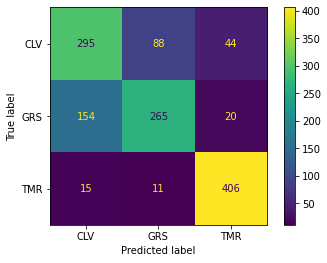

In [35]:
estimators = [ ("mnrk_itv1",minirocket_itv_clf(start=0, end=172,verbose=False)),
           ("mrsqm_itv1",mrsqm_itv_clf(nsax = 0, nsfa = 9,start=0, end=172,verbose=False)),
           ("freshprince_itv1",freshprince_itv_clf(start=0, end=172,fc_pars="efficient",verbose=False)),
           ("RidgeCV_itv1",ridgecv_clf(start=0, end=172,verbose=False)),
             ("LDA_itv1",lda_clf(start=0, end=172,verbose=False)), 
          ]

clf = VotingClassifier(estimators = estimators)


clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=clf.classes_)
disp.plot()
plt.show()

Accuracy: 0.7819722650231125


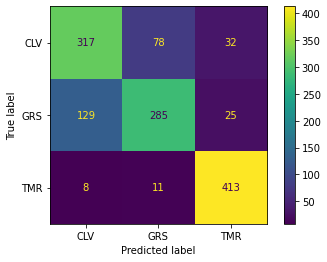

In [36]:
estimators = [ ("mnrk_itv1",minirocket_itv_clf(start=0, end=172,verbose=False)),
           ("mrsqm_itv1",mrsqm_itv_clf(nsax = 0, nsfa = 9,start=0, end=172,verbose=False)),
           ("freshprince_itv1",freshprince_itv_clf(start=0, end=172,fc_pars="efficient",verbose=False)),
           ("RidgeCV_itv1",ridgecv_clf(start=0, end=172,verbose=False)),
             ("LDA_itv1",lda_clf(start=0, end=172,verbose=False)), 
            ("mnrk_itv2",minirocket_itv_clf(start=206, end=536,verbose=False)),
           ("mrsqm_itv2",mrsqm_itv_clf(nsax = 0, nsfa = 9,start=206, end=536,verbose=False)),
           ("freshprince_itv2",freshprince_itv_clf(start=206, end=536,fc_pars="efficient",verbose=False)),
           ("RidgeCV_itv2",ridgecv_clf(start=206, end=536,verbose=False)),
             ("LDA_itv2",lda_clf(start=206, end=536,verbose=False)), 
          ]

clf = VotingClassifier(estimators = estimators)
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=clf.classes_)
disp.plot()
plt.show()

Accuracy: 0.7650231124807396


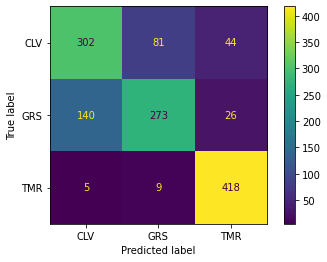

In [37]:
estimators = [ ("mnrk_itv1",minirocket_itv_clf(start=0, end=172,verbose=False)),
           ("mrsqm_itv1",mrsqm_itv_clf(nsax = 0, nsfa = 9,start=0, end=172,verbose=False)),
           ("freshprince_itv1",freshprince_itv_clf(start=0, end=172,fc_pars="efficient",verbose=False)),
           ("RidgeCV_itv1",ridgecv_clf(start=0, end=172,verbose=False)),
             ("LDA_itv1",lda_clf(start=0, end=172,verbose=False)), 
            ("mnrk_itv2",minirocket_itv_clf(start=206, end=536,verbose=False)),
           ("mrsqm_itv2",mrsqm_itv_clf(nsax = 0, nsfa = 9,start=206, end=536,verbose=False)),
           ("freshprince_itv2",freshprince_itv_clf(start=206, end=536,fc_pars="efficient",verbose=False)),
           ("RidgeCV_itv2",ridgecv_clf(start=206, end=536,verbose=False)),
             ("LDA_itv2",lda_clf(start=206, end=536,verbose=False)), 
          ]

weights = [2,2,2,2,2,1,1,1,1,1]

clf = VotingClassifier(estimators = estimators, weights=weights)
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                               display_labels=clf.classes_)
disp.plot()
plt.show()